In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [108]:
df = pd.read_csv(r"C:\Users\PREX\Documents\Data-Analytics-portfolio\google playstore\googleplaystore.csv")
df3 = pd.read_csv(r"C:\Users\PREX\Documents\Data-Analytics-portfolio\google playstore\googleplaystore_user_reviews.csv")
df3

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000
...,...,...,...,...,...
64290,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64291,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64292,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64293,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN


In [38]:
df3.drop_duplicates(inplace = True)

In [39]:
#pd.set_option("display.max_columns", 20)

In [40]:
df[['Genres', 'Sub-Genres']] = df['Genres'].str.split(";", expand = True)

In [41]:
df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up,None
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design,"January 15, 2018",2.0.0,4.0.3 and up,Pretend Play
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up,None
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up,None
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design,"June 20, 2018",1.1,4.4 and up,Creativity


In [42]:
df['Installs'] = df['Installs'].str.strip('+')


In [43]:
df['Installs'] = df['Installs'].str.replace(',', '')

In [44]:
df['Installs']= df['Installs'].str.replace('[^0-9]', '', regex = True)

In [45]:
df['Installs'] = df['Installs'].replace('', '0')
df['Installs']

0             10000
1            500000
2           5000000
3          50000000
4            100000
5             50000
6             50000
7           1000000
8           1000000
9             10000
10          1000000
11          1000000
12         10000000
13           100000
14           100000
15             5000
16           500000
17            10000
18          5000000
19         10000000
20           100000
21           100000
22           500000
23           100000
24            50000
25            10000
26           500000
27           100000
28            10000
29           100000
30           100000
31            50000
32           100000
33           100000
34            10000
35           100000
36           500000
37          5000000
38            10000
39           500000
40            10000
41           100000
42         10000000
43           100000
44            10000
45         10000000
46           100000
47           100000
48           100000
49           100000


In [46]:
#df.set_index('Last Updated')

#df.reset_index(drop = True)

In [47]:
def convert_date(date_str):
    try:
        return pd.to_datetime(date_str, format='%B %d, %Y')
    except ValueError:
        try:
            return pd.to_datetime(date_str, format='%d.%m.%y')
        except ValueError:
            return pd.NaT
df['Last Updated'] = df['Last Updated'].apply(convert_date)

In [48]:
df[df['Price'].str.contains("0") == False]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres
234,TurboScan: scan documents and receipts in PDF,BUSINESS,4.7,11442,6.8M,100000,Paid,$4.99,Everyone,Business,2018-03-25,1.5.2,4.0 and up,None
235,Tiny Scanner Pro: PDF Doc Scan,BUSINESS,4.8,10295,39M,100000,Paid,$4.99,Everyone,Business,2017-04-11,3.4.6,3.0 and up,None
290,TurboScan: scan documents and receipts in PDF,BUSINESS,4.7,11442,6.8M,100000,Paid,$4.99,Everyone,Business,2018-03-25,1.5.2,4.0 and up,None
291,Tiny Scanner Pro: PDF Doc Scan,BUSINESS,4.8,10295,39M,100000,Paid,$4.99,Everyone,Business,2017-04-11,3.4.6,3.0 and up,None
427,Puffin Browser Pro,COMMUNICATION,4.0,18247,Varies with device,100000,Paid,$3.99,Everyone,Communication,2018-07-05,7.5.3.20547,4.1 and up,None
476,"Moco+ - Chat, Meet People",DATING,4.2,1545,Varies with device,10000,Paid,$3.99,Mature 17+,Dating,2018-06-19,2.6.139,4.1 and up,None
477,Calculator,DATING,2.6,57,6.2M,1000,Paid,$6.99,Everyone,Dating,2017-10-25,1.1.6,4.0 and up,None
478,Truth or Dare Pro,DATING,NaN,0,20M,50,Paid,$1.49,Teen,Dating,2017-09-01,1.0,4.0 and up,None
479,"Private Dating, Hide App- Blue for PrivacyHider",DATING,NaN,0,18k,100,Paid,$2.99,Everyone,Dating,2017-07-25,1.0.1,4.0 and up,None
480,Ad Blocker for SayHi,DATING,NaN,4,1.2M,100,Paid,$3.99,Teen,Dating,2018-08-02,1.2,4.0.3 and up,None


In [49]:

df['Price'] = df['Price'].str.replace('[^0-9.]', '', regex=True)

In [50]:

pd.set_option('display.max_rows', 11000)

In [51]:
df = df.astype({'Installs':'int'})

In [52]:
df['Reviews'] = df['Reviews'].str.rstrip('M')
#.astype(int)

In [53]:
df['Reviews'] = df['Reviews'].astype(float)

In [54]:
df.dtypes

App                       object
Category                  object
Rating                   float64
Reviews                  float64
Size                      object
Installs                   int32
Type                      object
Price                     object
Content Rating            object
Genres                    object
Last Updated      datetime64[ns]
Current Ver               object
Android Ver               object
Sub-Genres                object
dtype: object

In [55]:
#EDA

<Axes: xlabel='Category'>

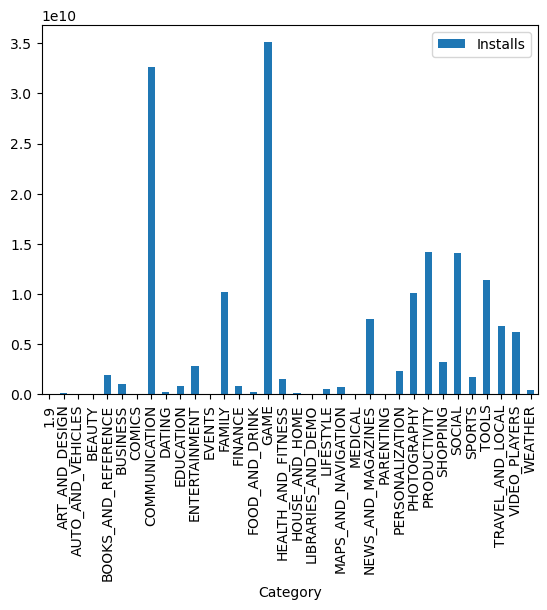

In [56]:
#df.groupby('Category').agg({'Category': 'count', 'Installs': 'sum'})\
 #   .plot(kind='bar', y='sum')
df.groupby('Category').agg({'Category': 'count', 'Installs': 'sum'})\
  .rename(columns={'Category': 'count'})\
  .plot(kind='bar', y='Installs')

In [57]:
df.groupby('Category')['Installs'].sum()

Category
1.9                              0
ART_AND_DESIGN           124338100
AUTO_AND_VEHICLES         53130211
BEAUTY                    27197050
BOOKS_AND_REFERENCE     1921469576
BUSINESS                1001914865
COMICS                    56086150
COMMUNICATION          32647276251
DATING                   264310807
EDUCATION                871452000
ENTERTAINMENT           2869160000
EVENTS                    15973161
FAMILY                 10258263505
FINANCE                  876648734
FOOD_AND_DRINK           273898751
GAME                   35086024415
HEALTH_AND_FITNESS      1583072512
HOUSE_AND_HOME           168712461
LIBRARIES_AND_DEMO        62995910
LIFESTYLE                537643539
MAPS_AND_NAVIGATION      724281890
MEDICAL                   53257437
NEWS_AND_MAGAZINES      7496317760
PARENTING                 31521110
PERSONALIZATION         2325494782
PHOTOGRAPHY            10088247655
PRODUCTIVITY           14176091369
SHOPPING                3247848785
SOCIAL     

In [58]:
df2 = df.filter(['Category', 'Installs', 'App'])

In [59]:
df2.groupby(['Category'])['App'].agg({'Installs':['max', 'min', 'sum']})

SpecificationError: nested renamer is not supported

In [ ]:
df[df['Installs'] > 100000]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres
1,Coloring book moana,ART_AND_DESIGN,3.9,967.0,14M,500000,Free,0,Everyone,Art & Design,2018-01-15,2.0.0,4.0.3 and up,Pretend Play
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510.0,8.7M,5000000,Free,0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up,None
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644.0,25M,50000000,Free,0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up,None
7,Infinite Painter,ART_AND_DESIGN,4.1,36815.0,29M,1000000,Free,0,Everyone,Art & Design,2018-06-14,6.1.61.1,4.2 and up,None
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791.0,33M,1000000,Free,0,Everyone,Art & Design,2017-09-20,2.9.2,3.0 and up,None
10,Text on Photo - Fonteee,ART_AND_DESIGN,4.4,13880.0,28M,1000000,Free,0,Everyone,Art & Design,2017-10-27,1.0.4,4.1 and up,None
11,Name Art Photo Editor - Focus n Filters,ART_AND_DESIGN,4.4,8788.0,12M,1000000,Free,0,Everyone,Art & Design,2018-07-31,1.0.15,4.0 and up,None
12,Tattoo Name On My Photo Editor,ART_AND_DESIGN,4.2,44829.0,20M,10000000,Free,0,Teen,Art & Design,2018-04-02,3.8,4.1 and up,None
16,Photo Designer - Write your name with shapes,ART_AND_DESIGN,4.7,3632.0,5.5M,500000,Free,0,Everyone,Art & Design,2018-07-31,3.1,4.1 and up,None
18,FlipaClip - Cartoon animation,ART_AND_DESIGN,4.3,194216.0,39M,5000000,Free,0,Everyone,Art & Design,2018-08-03,2.2.5,4.0.3 and up,None


In [ ]:
df[(df['Category'] == 'COMMUNICATION')]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres
335,Messenger – Text and Video Chat for Free,COMMUNICATION,4.0,56642847.0,Varies with device,1000000000,Free,0,Everyone,Communication,2018-08-01,Varies with device,Varies with device,None
336,WhatsApp Messenger,COMMUNICATION,4.4,69119316.0,Varies with device,1000000000,Free,0,Everyone,Communication,2018-08-03,Varies with device,Varies with device,None
337,Messenger for SMS,COMMUNICATION,4.3,125257.0,17M,10000000,Free,0,Teen,Communication,2018-06-06,1.8.9,4.1 and up,None
338,Google Chrome: Fast & Secure,COMMUNICATION,4.3,9642995.0,Varies with device,1000000000,Free,0,Everyone,Communication,2018-08-01,Varies with device,Varies with device,None
339,Messenger Lite: Free Calls & Messages,COMMUNICATION,4.4,1429035.0,Varies with device,100000000,Free,0,Everyone,Communication,2018-07-25,37.0.0.7.163,2.3 and up,None
340,Gmail,COMMUNICATION,4.3,4604324.0,Varies with device,1000000000,Free,0,Everyone,Communication,2018-08-02,Varies with device,Varies with device,None
341,Hangouts,COMMUNICATION,4.0,3419249.0,Varies with device,1000000000,Free,0,Everyone,Communication,2018-07-21,Varies with device,Varies with device,None
342,Viber Messenger,COMMUNICATION,4.3,11334799.0,Varies with device,500000000,Free,0,Everyone,Communication,2018-07-18,Varies with device,Varies with device,None
343,My Tele2,COMMUNICATION,4.3,158679.0,8.8M,5000000,Free,0,Everyone,Communication,2018-08-03,2.4.1,4.4 and up,None
344,Firefox Browser fast & private,COMMUNICATION,4.4,3075028.0,Varies with device,100000000,Free,0,Everyone,Communication,2018-07-10,Varies with device,Varies with device,None


In [ ]:
df[df['App'] == 'Google Ads']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres
238,Google Ads,BUSINESS,4.3,29313.0,20M,5000000,Free,0,Everyone,Business,2018-07-30,1.12.0,4.0.3 and up,None
267,Google Ads,BUSINESS,4.3,29313.0,20M,5000000,Free,0,Everyone,Business,2018-07-30,1.12.0,4.0.3 and up,None
4979,Google Ads,BUSINESS,4.3,29331.0,20M,5000000,Free,0,Everyone,Business,2018-07-30,1.12.0,4.0.3 and up,None


In [82]:
df.reset_index(drop = True)

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159.0,19M,10000,Free,0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up,None
1,Coloring book moana,ART_AND_DESIGN,3.9,967.0,14M,500000,Free,0,Everyone,Art & Design,2018-01-15,2.0.0,4.0.3 and up,Pretend Play
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510.0,8.7M,5000000,Free,0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up,None
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644.0,25M,50000000,Free,0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up,None
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967.0,2.8M,100000,Free,0,Everyone,Art & Design,2018-06-20,1.1,4.4 and up,Creativity
5,Paper flowers instructions,ART_AND_DESIGN,4.4,167.0,5.6M,50000,Free,0,Everyone,Art & Design,2017-03-26,1.0,2.3 and up,None
6,Smoke Effect Photo Maker - Smoke Editor,ART_AND_DESIGN,3.8,178.0,19M,50000,Free,0,Everyone,Art & Design,2018-04-26,1.1,4.0.3 and up,None
7,Infinite Painter,ART_AND_DESIGN,4.1,36815.0,29M,1000000,Free,0,Everyone,Art & Design,2018-06-14,6.1.61.1,4.2 and up,None
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791.0,33M,1000000,Free,0,Everyone,Art & Design,2017-09-20,2.9.2,3.0 and up,None
9,Kids Paint Free - Drawing Fun,ART_AND_DESIGN,4.7,121.0,3.1M,10000,Free,0,Everyone,Art & Design,2018-07-03,2.8,4.0.3 and up,Creativity


In [63]:
google_apps = df[df['App'].str.contains('Google') == True]
df2.head()

,Category,Installs,App
0,ART_AND_DESIGN,10000,Photo Editor & Candy Camera & Grid & ScrapBook
1,ART_AND_DESIGN,500000,Coloring book moana
2,ART_AND_DESIGN,5000000,"U Launcher Lite – FREE Live Cool Themes, Hide ..."
3,ART_AND_DESIGN,50000000,Sketch - Draw & Paint
4,ART_AND_DESIGN,100000,Pixel Draw - Number Art Coloring Book


In [75]:
merged_google = google_apps.merge(df3, how= 'inner', left_on = 'App', right_on = 'App')

In [85]:
merged_google.fillna(0, inplace= True)

C:\Users\PREX\AppData\Local\Temp\ipykernel_15144\2670100916.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_google.fillna(0, inplace= True)


In [77]:
merged_google.set_index('App').head(10)

,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
App,,,,,,,,,,,,,,,,,
Google Play Books,BOOKS_AND_REFERENCE,3.9,1433233.0,Varies with device,1000000000,Free,0,Teen,Books & Reference,2018-08-03,Varies with device,Varies with device,0,0,0,0.000000,0.000000
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,When I try change cover photo ends posting new...,Negative,-0.244318,0.677273
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,I can't post pics videos even I able change pr...,Positive,0.500000,0.625000
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,"Thanks disabling business page reason, awful m...",Negative,-0.600000,0.733333
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,Already I created business account using email...,Neutral,0.000000,0.100000
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,I installed load anything. I get spinning load...,Neutral,0.000000,0.000000
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,We dealing refrigeration air conditioning Spar...,Positive,0.500000,0.900000
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,"Love app, help improve business. Thank much",Positive,0.350000,0.400000
Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,It's best ever small business ...,Positive,0.375000,0.350000


In [67]:
merged_google.groupby("Category")['App'].count()

Category
BOOKS_AND_REFERENCE      1
BUSINESS               239
COMMUNICATION           71
EDUCATION                3
ENTERTAINMENT            1
FAMILY                   1
FINANCE                160
HEALTH_AND_FITNESS      40
NEWS_AND_MAGAZINES     164
PHOTOGRAPHY            408
PRODUCTIVITY           299
SOCIAL                   6
TOOLS                  274
TRAVEL_AND_LOCAL        90
VIDEO_PLAYERS            1
Name: App, dtype: int64

In [86]:
merged_google['Last Updated'] = merged_google['Last Updated'].astype(str)
merged_google

C:\Users\PREX\AppData\Local\Temp\ipykernel_15144\2584915138.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_google['Last Updated'] = merged_google['Last Updated'].astype(str)


,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
1,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,When I try change cover photo ends posting new...,Negative,-0.244318,0.677273
2,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,I can't post pics videos even I able change pr...,Positive,0.500000,0.625000
3,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,"Thanks disabling business page reason, awful m...",Negative,-0.600000,0.733333
4,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,Already I created business account using email...,Neutral,0.000000,0.100000
5,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,I installed load anything. I get spinning load...,Neutral,0.000000,0.000000
6,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,We dealing refrigeration air conditioning Spar...,Positive,0.500000,0.900000
7,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,"Love app, help improve business. Thank much",Positive,0.350000,0.400000
8,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,It's best ever small business ...,Positive,0.375000,0.350000
9,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,I tried many times get issue solved every time...,Positive,0.250000,0.550000
10,Google My Business,BUSINESS,4.4,70991.0,Varies with device,5000000,Free,0,Everyone,Business,2018-07-24,2.19.0.204537701,4.4 and up,0,My create post visible ...kindly fix .,Neutral,0.000000,0.000000


In [88]:
merged_google['Last Updated'] = merged_google['Last Updated'].str.split(' ', expand=True)[0]
#merged_google['Last Updated'].str.split('-', expand=True)[0]

C:\Users\PREX\AppData\Local\Temp\ipykernel_15144\2461064529.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_google['Last Updated'] = merged_google['Last Updated'].str.split(' ', expand=True)[0]


In [89]:
merged_google = merged_google[merged_google['Sentiment'] != 0]

In [98]:
merged_data_plot = merged_google.groupby(['App', 'Sentiment'])[['App', 'Sentiment', 'Category', 'Installs', 'Sentiment_Polarity']].agg({'Installs':'sum', 'Sentiment_Polarity':'mean'})

In [99]:
merged_data_plot

Installs  \
App                                             Sentiment                 
Files Go by Google: Free up space on your phone Negative       90000000   
                                                Positive      250000000   
Gboard - the Google Keyboard                    Negative    25500000000   
                                                Neutral      1500000000   
                                                Positive    30000000000   
Google                                          Negative     6000000000   
                                                Neutral     14000000000   
                                                Positive    56000000000   
Google Ads                                      Negative      150000000   
                                                Neutral       105000000   
                                                Positive      330000000   
Google Duo - High Quality Video Calls           Negative     2000000000   
                                                Neutral      1000000000   
                                                Positive    15000000000   
Google Earth                                    Negative     2000000000   
                                                Neutral      1000000000   
                                                Positive     4600000000   
Google Fit - Fitness Tracking                   Negative      120000000   
                                                Neutral        60000000   
                                                Positive      220000000   
Google Handwriting Input                        Negative       10000000   
                                                Neutral       150000000   
                                                Positive      200000000   
Google Keep                                     Negative     4000000000   
                                                Neutral      1200000000   
                                                Positive    11200000000   
Google My Business                              Negative       45000000   
                                                Neutral       195000000   
                                                Positive      315000000   
Google News                                     Negative    52000000000   
                                                Positive   108000000000   
Google PDF Viewer                               Negative      330000000   
                                                Neutral       210000000   
                                                Positive      660000000   
Google Pay                                      Negative     4000000000   
                                                Neutral       800000000   
                                                Positive    10800000000   
Google Photos                                   Negative    96000000000   
                                                Neutral      4000000000   
                                                Positive   304000000000   
Google Primer                                   Positive       20000000   
Google Slides                                   Positive      100000000   
Google Street View                              Negative     6000000000   
                                                Neutral      2000000000   
Google Translate                                Positive     2000000000   
Google Trips - Travel Planner                   Positive        5000000   
Google Voice                                    Neutral       120000000   
                                                Positive      120000000   
Google+                                         Positive     4000000000   

                                                           Sentiment_Polarity  
App                                             Sentiment                      
Files Go by Google: Free up space on your phone Negative            -0.072468

<Axes: xlabel='App,Sentiment'>

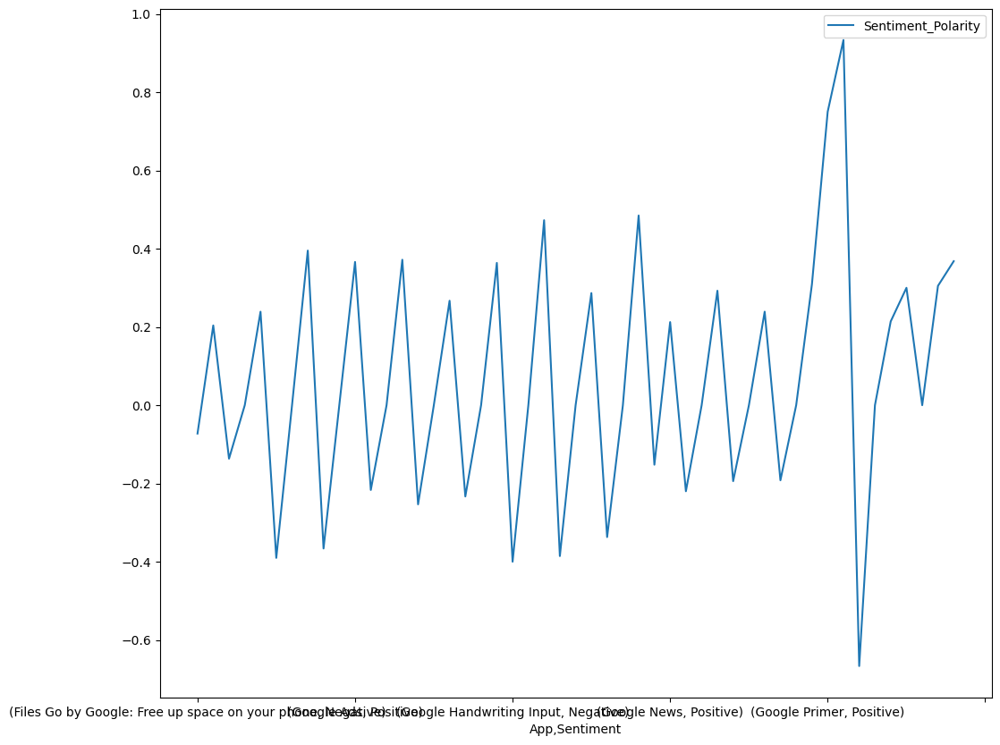

In [103]:
merged_data_plot.plot.line( y='Sentiment_Polarity', figsize = (12,10))

In [ ]:
#take one of the apps and see it's perfomance with respect to sentiment polarity

In [107]:
merged_google[merged_google['App'].str.contains('Gboard - the Google Keyboard') == True]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Sub-Genres,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
842,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,This pretty good except typing slide part. Tha...,Positive,0.110000,0.335000
843,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,This best keyboard. The ability different them...,Positive,0.345000,0.560833
844,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,I keyboard typing English Bengali language. Bu...,Positive,0.020833,0.262500
845,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,At first seems fine honesty I used new feature...,Positive,0.154377,0.449158
846,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,The inbuilt keyboard 10+ year old previous HTC...,Positive,0.114286,0.384127
847,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,Overall good implementation daily keyboard loo...,Positive,0.050000,0.504545
848,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,I love Google keyboard awesome! I love search ...,Positive,0.344444,0.822222
850,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,This used actually learn I spoke (typed) prett...,Negative,-0.015152,0.572727
851,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,I've using Gboard ever since swipe. It progres...,Positive,0.566667,0.533333
852,Gboard - the Google Keyboard,TOOLS,4.2,1859115.0,Varies with device,500000000,Free,0,Everyone,Tools,2018-07-31,Varies with device,Varies with device,0,The search option keyboard recently stopped wo...,Positive,0.208333,0.375000
